In [1]:
from IPython.display import Image,display

# Ttest
## Distribution Analysis (<font color='red'>proc univariate</font>)
## One sample Ttest  (<font color='red'>proc ttest</font>)
- st101s01

```SAS
%let interval=BodyTemp HeartRate;

ods graphics;
ods select histogram;
proc univariate data=STAT1.NormTemp noprint;
    var &interval;
    histogram &interval / normal kernel;      
    inset n mean std / position=ne;           
    title "Interval Variable Distribution Analysis";   
run;
title;

proc ttest data=STAT1.NormTemp h0=98.6    
           plots(only shownull)=interval; 
   var BodyTemp;
   title 'Testing Whether the Mean Body Temperature = 98.6';
run;
title;
```
- **normal kernel**: histograms with normal curves, kernal density estimates 
- **inset n mean std**: insets sample size, means and standard deviations
- **h0=98.6**: null hypothesis
- **shownull**:add reference;Interval:Produce a confidence interval 

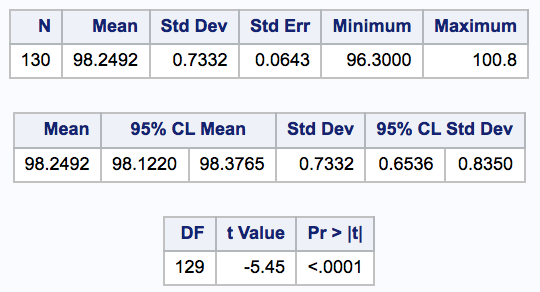

In [2]:
display(Image("fig/1Sample_Ttest.png", width=400))

## Two sample Ttest  (<font color='red'>proc ttest</font>)
- st101s02

```SAS
ods graphics;
proc ttest data=STAT1.German plots(shownull)=interval;
   class Group;   
   var Change;
   title "German Grammar Training, Comparing Treatment to Control";
run;
title;
```
- st101d03

```SAS
ods graphics;
proc ttest data=STAT1.ameshousing3 plots(shownull)=interval;
    class Masonry_Veneer; 
    var SalePrice;
    format Masonry_Veneer $NoYes.;
    title "Two-Sample t-test Comparing Masonry Veneer, No vs. Yes";
run;
title;
```
- **A class statement is required in a two-sample t test**, used to create a variable to seperate data to desired two classes

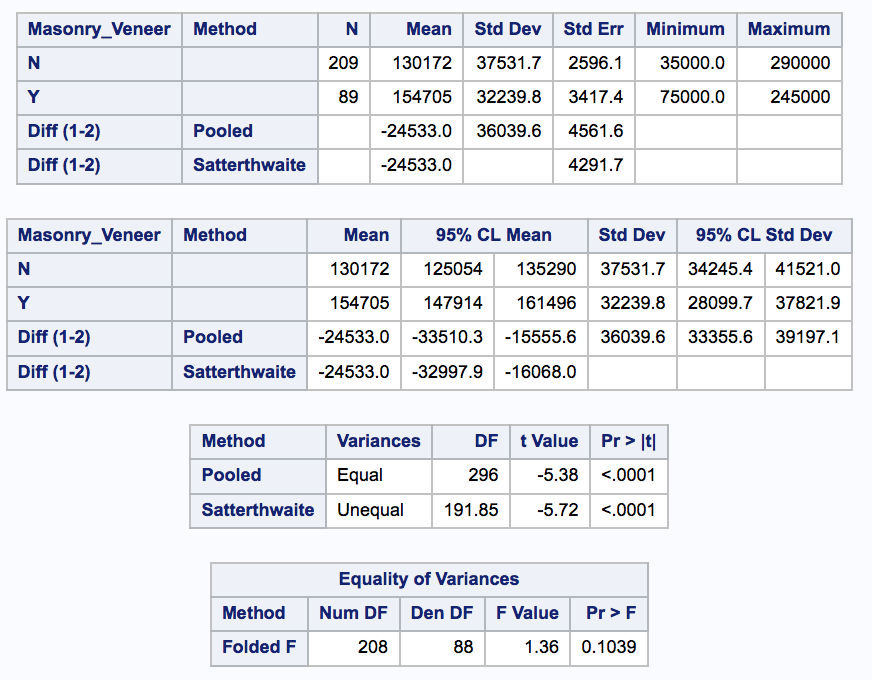

In [3]:
display(Image("fig/2Sample_Ttest.png", width=500))

# Graphical Analysis (<font color='red'>proc sgplot/sgscatter</font>)
- st102d01

```SAS
options nolabel;                              
proc sgscatter data=STAT1.ameshousing3;
    plot SalePrice*(&interval) / reg;         
    title "Associations of Interval Variables with Sale Price";
run;

proc sgplot data=STAT1.ameshousing3;
    vbox SalePrice / category=Central_Air     
                     connect=mean;
    title "Sale Price Differences across Central Air";
run;
```
- **nolabel**:not to use labels for the variables
- **reg**: include a regression line

# ANOVA (<font color='red'>proc glm</font>)
## One way ANOVA
- st102d02
```SAS
ods graphics;
proc glm data=STAT1.ameshousing3 plots=diagnostics;  
    class Heating_QC;                                
    model SalePrice=Heating_QC;        /* y = kx+b */
	means Heating_QC / hovtest=levene;  
    format Heating_QC $Heating_QC.;
    title "One-Way ANOVA with Heating Quality as Predictor";
run;
quit;
title;
```
- **PLOTS=diagnostics** option to produce a panel display of the diagnostic plots. 
- **CLASS** statement indicates our categorical predictor variable, Heating_QC. 
- **MODEL** statement specify the dependent and independent variables as indicated in the ANOVA model, SalePrice=Heating_QC.
- **MEANS** statement computes the unadjusted means, or arithmetic means, of the dependent variable SalePrice for each level of the specified effect, Heating_QC. 
- **HOVTEST=levene** option to performs Levene's test for homogeneity of variances by default. The null hypothesis is that all group variances are equal. 
- **FORMAT** statement to display descriptive labels for Heating_QC instead of the actual data values, TA, EX, Fa, and Gd.
- PROC GLM supports RUN-group processing, which means that the procedure stays active until SAS encounters a PROC, DATA, or QUIT statement. RUN-group processing enables you to submit additional statements, followed by another RUN statement, without resubmitting the PROC statement.

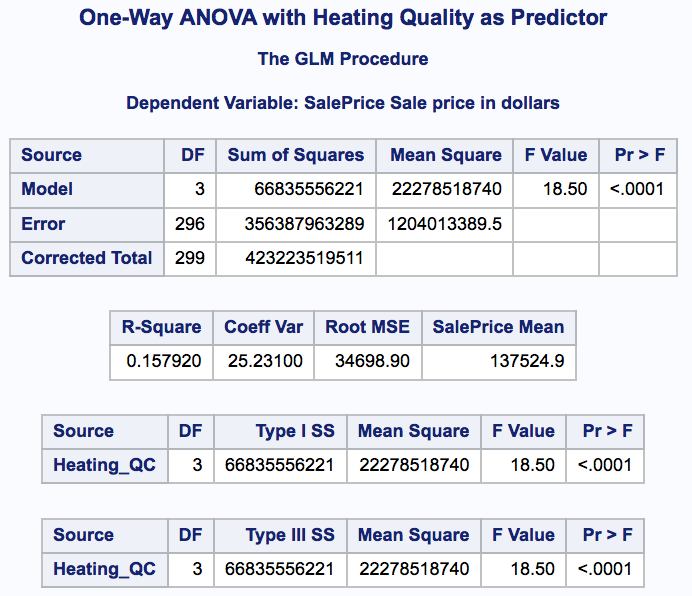

In [4]:
display(Image("fig/1way_ANOVA.png", width=500))

- First table: 
    - Model Sum of Squares (SSM),Error Sum of Squares (SSE), Total Sum of Squares (SST); 
    - Mean Square Errror are MSM = SSM/DF, MSE = SSE/DF, MST=SST/DF. 
- Second table: 
    - R-Square: The proportion of variance accounted for by the model. It is a goodness of fit measure.
                Heating_QC explains about 16% of the variability of SalePrice.
    - **Root MSE** = $\sqrt{MSE}$. It is an estimate of the standard deviation for all treatment groups.
    - **Coefficient of variation** is represented as a percent of the mean, so the root MSE divided by the SalePrice mean, all times 100. It's a unitless measure that's useful in comparing the variability of two sets of data with different units of measurement. 
    - **The SalePrice Mean** is the overall mean ignoring the type of heating quality.
- Third Table:
    - **Type I Sum of Squares** specify指的是 the **sums of squares (SSM)** accounted for by adding effects into the model sequentially. However, for a one-way analysis of variance, only a single effect is included in the model. 类型I的平方和指通过将效果顺序添加到模型中而考虑的平方和。 但是，对于单向方差分析，模型中仅包含单个效果。

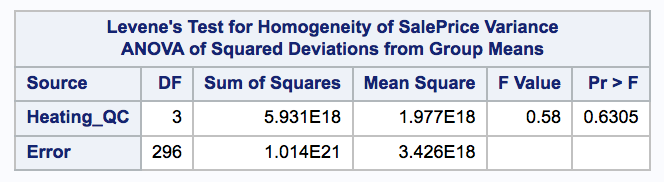

In [5]:
display(Image("fig/Levene.png", width=500))

- The p-value of 0.6305 is not smaller than your alpha level of 0.05, and therefore, you do not reject the null hypothesis. 
- Evidence suggests that the variances within each group of heating quality are not statistically different.没有统计学差异

## ANOVA Post Hoc Tests
- $EER=1-(1-\alpha)^{nc}$, here EER stands 'Experimentwise Error Rate' and nc stands 'Number of Comparisons';
- With a statistically conservative multiple comparison method, such as the Tukey or Dunnett method, you control for the EER, so there's a tendency to find fewer significant differences than might otherwise be found. When you make no adjustments for multiple comparisons, you are likely to find more significant differences than might otherwise be found.
- If only the comparisonwise error rate is controlled, the overall risk of a Type I error across all the comparisons is increased (and therefore the risk of Type II error is decreased), so the test might find more significant differences than would otherwise be found.
- **st102d03**

```SAS
ods graphics;
ods select lsmeans diff diffplot controlplot;

proc glm data=STAT1.ameshousing3 
         plots(only)=(diffplot(center) controlplot);
    class Heating_QC;
    model SalePrice=Heating_QC;
    lsmeans Heating_QC / pdiff=all                
                         adjust=tukey;            
    lsmeans Heating_QC / pdiff=control('Average/Typical') 
                         adjust=dunnett;
    format Heating_QC $Heating_QC.;
    title "Post-Hoc Analysis of ANOVA - Heating Quality as Predictor";
run;
quit;
title;
```
- **PDIFF=ALL** requests to compare all means, and produces a diffogram automatically.
- **PDIFF=CONTROL** requests that each level be compared to a control level. "Average/Typical" will result in three comparisons, one for each remaining level versus the control. 
- **ADJUST=tukey/dunnett** specifies the adjustment method for multiple comparisons. (By default: tukey)
    - **Tukeys adjustment** will maintain the experimentwise error rate at 0.05 for all six pairwise comparisons.
    - **Dunnett** maintains an experimentwise error rate of 0.05 for all three comparisons and creates a control plot.
- Plots option:
    - **CENTER** adds a dot to the intersection of two least squares means for each comparison.
    - **CONTROLPLOT** requests a display in which least squares means are compared against a reference level.

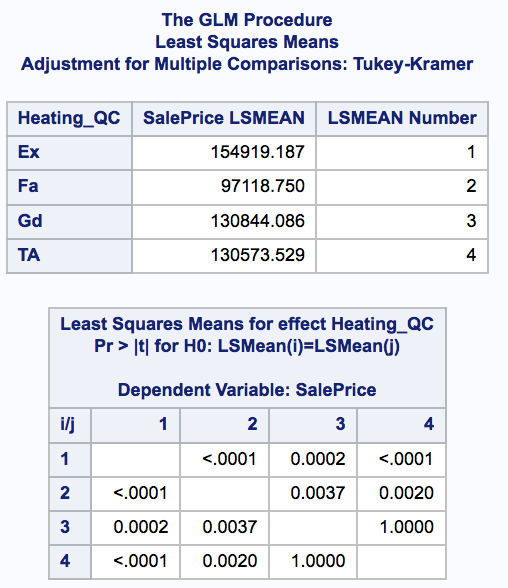

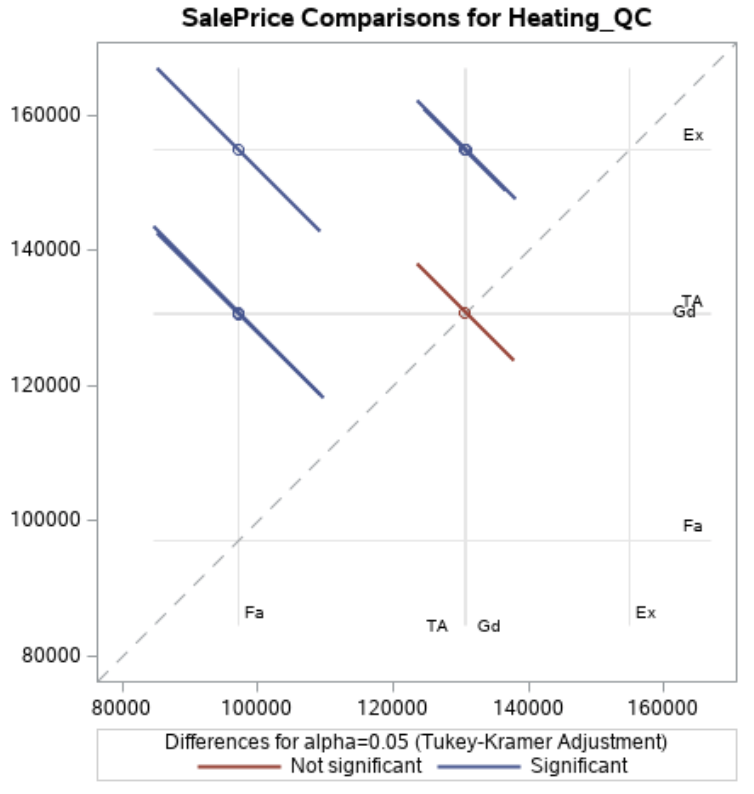

In [6]:
display(Image("fig/post_hoc.png", width=300),Image("fig/diff_plot.png", width=300))

- The first table shows the means for each group.
- The second table shows the p-values from pairwise comparisons of all possible combinations of means.
- The comparisons of least square means are also shown graphically in the diffogram.
    - The **blue solid lines denote significant differences** between heating quality levels, because these confidence intervals for the difference do not cross the diagonal equivalence line.
    - **Red dashed lines indicate a non-significant difference** between treatments.
    - Starting at the top, left to right. 
        - Excellent is significantly different from Fair, from Good, and from Average/Typical. 
        - Good is significantly different from Fair, but not from Average/Typical. 
        - Average/Typical is significantly different from Fair. 

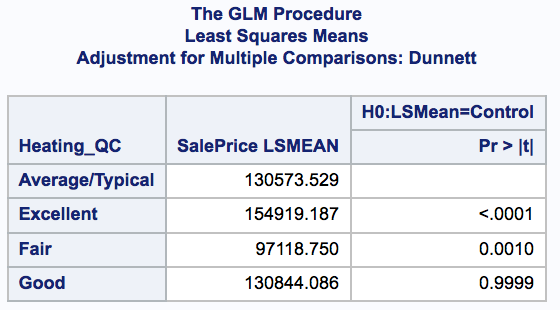

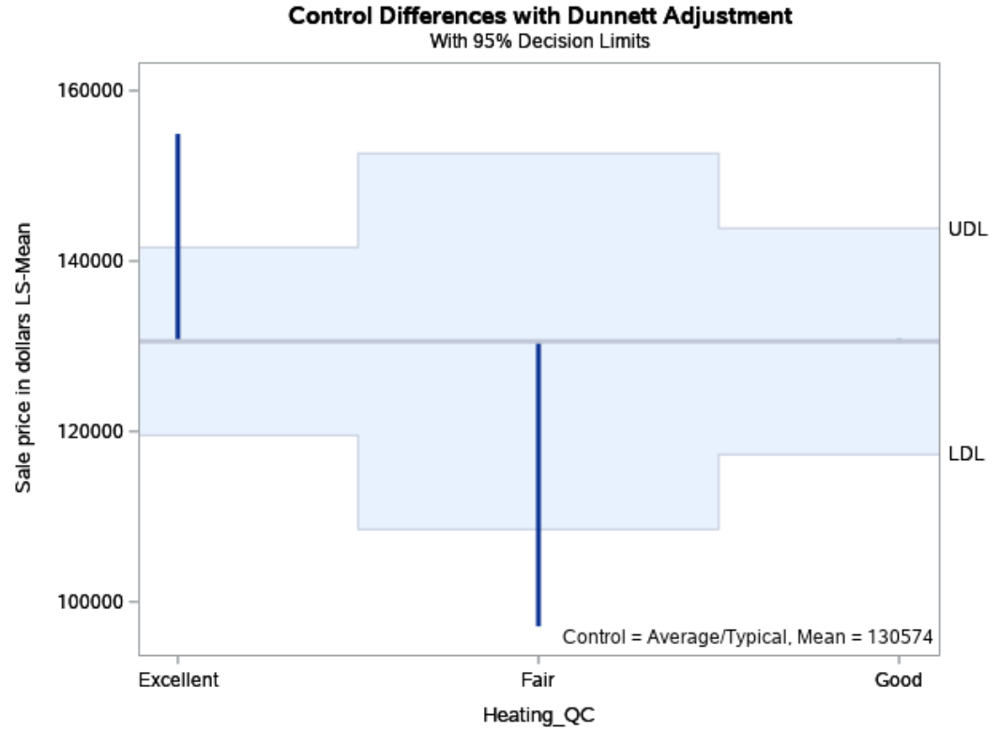

In [7]:
display(Image("fig/post_hoc2.png", width=400),Image("fig/diff_plot2.png", width=350))

- All other quality levels are compared to Average/Typical. Good is not significantly different from that control level.
- The horizontal line is drawn at **the least squares mean for Average/Typical**, which is $130,574.
- The other three means are represented by the ends of the vertical lines extending from the horizontal control line.
- Blue areas of non-significance vary in size. This is because different comparisons involve different sample sizes. Smaller sample sizes require larger mean differences to reach statistical significance. 
- This control plot shows significant differences between Excellent and Average/Typical, and between Fair and Average/Typical, just like in the table above.

- **st102s02**

```SAS
ods graphics;

ods select lsmeans diff diffplot controlplot;
proc glm data=STAT1.Garlic 
         plots(only)=(diffplot(center) controlplot);
    class Fertilizer;
    model BulbWt=Fertilizer;
    Tukey: lsmeans Fertilizer / pdiff=all 
                         adjust=tukey;
    Dunnett:lsmeans Fertilizer / pdiff=control('4') 
                         adjust=dunnett;
    No_Adjust: lsmeans Fertilizer / pdiff=all adjust=t;
    title "Post-Hoc Analysis of ANOVA - Fertilizer as Predictor";
run;
quit;

title;
```

## Two-Way ANOVA
- $H0:~\alpha_i=0~and~\beta_j=0~and~(\alpha\beta)_{ij}=0$
- **st103d01**

```SAS
ods graphics off;
proc sgplot data=STAT1.ameshousing3;        
    vline Season_Sold / group=Heating_QC    
                        stat=mean           
                        response=SalePrice 
                        markers;
    format Season_Sold season.;
run; 

ods graphics on;
proc glm data=STAT1.ameshousing3 order=internal; 
    class Season_Sold Heating_QC;   
    model SalePrice = Heating_QC Season_Sold; /* y = k1*x1+k2*x2 +b */
    lsmeans Season_Sold / diff adjust=tukey;          
    format Season_Sold season.;
    title "Model with Heating Quality and Season as Predictors";
run;
quit;

title;
```
- **vline**: line chart, x=season_sold
- **stat=mean**: plot mean of response
- **response=**: y
- **ORDER=INTERNAL**: use the order of the variable values stored internally
- **Class** statement: The first variable labels the X axis, the second variable is represented by the color-coded lines.
- **LSMEANS** statement requests a Tukey-adjusted analysis of the difference across all seasons.

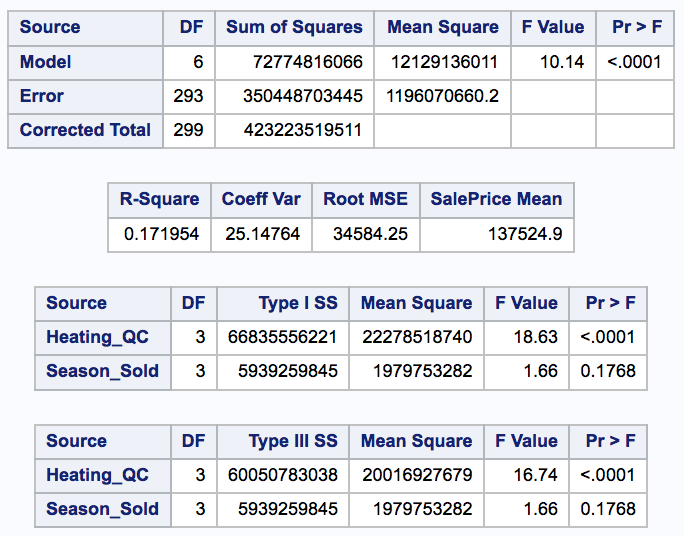

In [8]:
display(Image("fig/2way_ANOVA.png", width=400))

- **R-square value** (0.171954) indicates approximately 17% of the variability in SalePrice is explained by the two categorical predictors.
- In the **Type I** table, each effect is tested sequentially, and adjusts for all preceding listed effects. 
    - In other words, the order of the effects matters. The model specification determines the order in this table. The test of Heating_QC is an unadjusted test, because there are no other terms above it, whereas the Season_Sold test adjusts for the Heating_QC, which appears before it. The test for Season_Sold asks whether the season can explain the leftover variation in SalePrice after heating quality has explained as much of the sales price variation as possible. 
    - Typically, only Type III sums of squares tables are interpreted and reported for ANOVA. Type I sums of squares are more useful in say, polynomial regression models when we want to understand how high-order terms sequentially benefit the model.

- **Type III** values are not generally additive, and the values do not necessarily sum to the model sums of squares. 
    - In the Type III table, all listed effects are adjusted for all other effects in the table, so **order is not important**. 
    - The Type III sums of squares for a variable, also called the partial sums of squares, is the increase in the model sum of squares due to adding the variable to a model which already contains all the other variables.

- Judging from the p-values in the Type III sums of squares table, there seems to be no significant differences across levels of Season_Sold, with a p-value of 0.1768, but there are significant differences across the Heating_QC variable, with a p-value less than .0001. That is, **even after you control for the effects of Season_Sold, the Heating Quality variable still explains significant differences in SalePrice**.

## **Interaction**(<font color='red'>proc plm</font>)
- comparing the effect of one variable on the response at different levels of another using group means, 
- or plotting the means to investigate different effect patterns on the response for a variable at different levels of another.  
- **st103d02**:

```SAS
ods graphics on;

proc glm data=STAT1.ameshousing3 
         order=internal 
         plots(only)=intplot;
    class Season_Sold Heating_QC;
    model SalePrice = Heating_QC Season_Sold Heating_QC*Season_Sold;
    lsmeans Heating_QC*Season_Sold / diff slice=Heating_QC;
    format Season_Sold Season.;
    store out=interact;
    title "Model with Heating Quality and Season as Interacting Predictors";
run;
quit;

```
- **DIFF**:  computes and compares least squares means of the model effects.
- **SLICE=**: slices the interaction effect by the different levels of heating quality.
- **STORE** statement saves the results in an item store named interact, so that we can perform further analysis post model fitting.

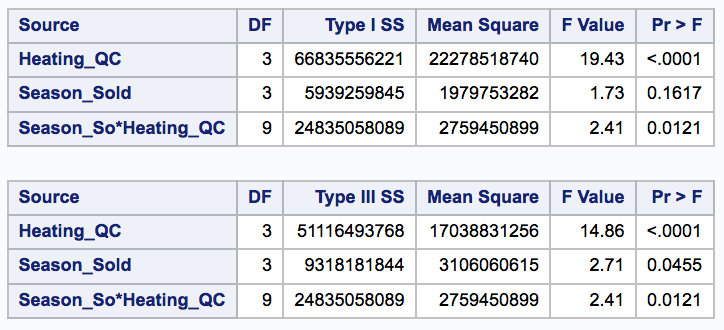

In [9]:
display(Image("fig/2way_ANOVA_Inter.png", width=400))

- The p-value, 0.0121, indicates that the interaction effect is statistically significant. This means that the effect of Season_Sold differs at different levels of Heating_QC. 

```SAS
proc plm restore=interact plots=all;
    slice Heating_QC*Season_Sold / sliceby=Heating_QC adjust=tukey;
    effectplot interaction(sliceby=Heating_QC) / clm;
run; 

title;
```
- **EFFECTPLOT** statement to request interaction plots sliced by heating quality.
- **CLM** requests confidence limits for the means.
- **SLICE** requests tables for the interaction term, Heating_QC crossed with Season_Sold, sliced by the different levels of heating quality. 
- **ADJUST=TUKEY** adjusts the p-values for multiple comparison tests. 

-  Explore the nature of the interaction
    - additional graphics, 
    - differences of least squares means, 
    - tests of simple effects.

# Pearson Correlation (<font color='red'>proc corr</font>)
- The Pearson correlation statistic is a measure of the linear relationship, or association, between two continuous variables. The closer the value is to -1, the stronger the negative linear relationship is between the two variables. The closer the value is to 0, the weaker the linear relationship. A correlation coefficient of 0 means that no linear relationship or association exists between the two variables.
- Avoiding Common Errors When Interpreting Correlations:
    - Correlation does not imply causation
    - Misinterpreting the type of relationship between variables. Their relationship is $y=x^2$ or other types.
    - Influence of outliers on the correlation.
        - Verify that it's a valid measurement and not an error. If the point is valid and you can collect more data, try collecting more data to see whether a linear relationship unfolds, focusing on the area between the outlier and the group of data points. If you can, try to replicate the unusual data point by collecting data at a fixed value of X.
        - If you can neither verify that the data point is valid nor replicate it. Compute two correlation coefficients, one with the outlier and one without it. Then report both correlation coefficients in order to report how influential the unusual data point is in your analysis.
- Correlations between the response variable and potential predictors can be useful by suggesting variables that should be included or excluded from model building. Often, modelers have many predictors, and thus, a very large number of possible models to explore. 

    - Predictors with a weak or no relationship with the response variable might sometimes be excluded. Typically, the decision to throw out a variable is based on multivariable analyses. However, if the modeler has far more predictors than can be used and variable reduction becomes necessary (often under time pressure), predictors with weak or no correlation with the response variable are good candidates for exclusion. 

    - Part of correlation analysis involves visually assessing associations between variables by looking at scatter plots. When these plots reveal patterns in the data, such as curvilinear relationships, a modeler might need to build additional terms into the model, such as polynomials.

    - Another reason to create scatter plots is to assess the linear relationship between pairs of predictor variables. When predictors are highly correlated, they provide redundant information. Multicollinearity (strong correlations among sets of predictors) can destabilize parameter estimates and degrade the ability of model selection routines, such as stepwise selection, to select good variables. 

    - Correlation analysis is one of several ways to address collinearity prior to model building.

- st102d04

```SAS
ods graphics / reset=all imagemap;   

proc corr data=STAT1.AmesHousing3 rank     
     plots(only)=scatter(nvar=all ellipse=none); 
   var &interval;
   with SalePrice;            
   id PID;             
   title "Correlations and Scatter Plots with SalePrice";
run;
 
ods graphics off;
proc corr data=STAT1.AmesHousing3 
          nosimple 
          best=3;  
   var &interval;
   title "Correlations and Scatter Plot Matrix of Predictors";
run;
title;
```
- **imagemap**: enables tooltips to be used in HTML output. Tooltips enable you to identify data points by moving the cursor over observations in a plot.
- **rank**: |r| from highest to lowest
- **NVAR=ALL**: plot for all variables in VAR statement
- **ELLIPSE=NONE**: drawing scatter plots. 
- **with**: each continuous variable correlate with  this variable.
- **id**: any variable in the ID statement is the variable PID. 
- **NOSIMPLE**: printing the simple descriptive statistics 
- **BEST=3**: prints the 3 highest correlation coefficients for each variable

- st102s03

```SAS
proc corr data=STAT1.BodyFat2 
          nosimple            
          best=5
          out=pearson;  
   var &interval;
   title "Correlations of Predictors";
run;

%let big=0.7;
proc format;               /* Define a format  */
    picture correlations &big -< 1 = '009.99' (prefix="*")        
                         -1 <- -&big = '009.99' (prefix="*")
                         -&big <-< &big = '009.99';
run;

data bigcorr;
    set pearson;
    array vars{*} &interval;    
    do i=1 to dim(vars);
        if abs(vars{i})<&big then vars{i}=.;   
    end; 
    if _type_="CORR";     
    drop i _type_;
run;

proc print data=bigcorr;
    format &interval 5.2;
run;
```
- **out=**: put the results to pearson file, not limit to 5 highest.
- **array vars{*} &interval;**:create array; vars{*} means all variables in pearson table
- **vars{i}=.**: set vars as missing value 
- **if _type_="CORR";**: only input the data where _type_=CORRE

# Linear Regression
## Simple Linear Model  (<font color='red'>proc reg</font>) 
- **st102d05**

```SAS
ods graphics;

proc reg data=STAT1.ameshousing3;
    model SalePrice=Lot_Area;    /* y=x */
    title "Simple Regression with Lot Area as Regressor";
run;
quit;
```

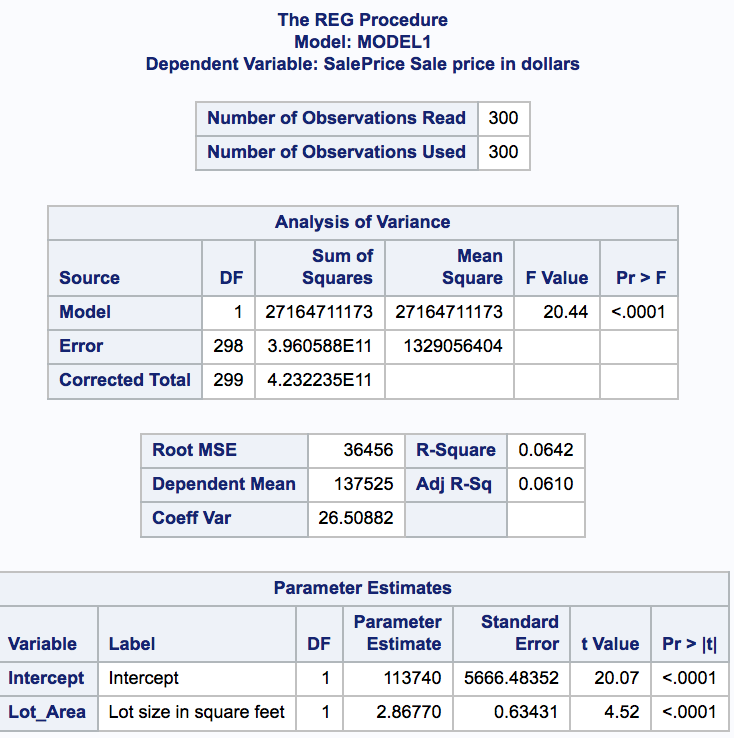

In [10]:
display(Image("fig/reg_out.png", width=400))

## Complex Linear Model
- Explanatory analysis and prediction
- Adjusted R square

$\displaystyle R^2_{ADJ} = 1-\frac{(n-i)(1-R^2)}{n-p}$
    - n is the number of observations that are used to fit the model.
    - i equals 1 if there is an intercept, or zero if there is no intercept.
    - p is the number of parameters in the model.
    - R-square as a penalized version of R-square. The penalty increases with each parameter that is added to the model. The adjusted R-square increases only if the additional terms improve the model enough to warrant increasing its complexity.
- **st103d03**

```SAS
ods graphics on;

proc reg data=STAT1.ameshousing3 ;
    model SalePrice=Basement_Area Lot_Area;
    title "Model with Basement Area and Lot Area";
run;
quit;

proc glm data=STAT1.ameshousing3 
         plots(only)=(contourfit);
    model SalePrice=Basement_Area Lot_Area;
    store out=multiple;
    title "Model with Basement Area and Gross Living Area";
run;
quit;

proc plm restore=multiple plots=all;
    effectplot contour (y=Basement_Area x=Lot_Area);
    effectplot slicefit(x=Lot_Area sliceby=Basement_Area=250 to 1000 by 250);
run; 

title;
```
-  **EFFECTPLOT  CONTOUR** requests a contour plot of predicted values against two continuous predictors. Basement_Area plotted on the Y axis, and Lot_Area on the X axis.
- **SLICEFIT** displays a curve of predicted values versus a continuous variable grouped by the levels of another effect. 
- The F test in the ANOVA table tests the global hypothesis for the model. F tests in the Type I and Type III tables, as well as the t tests in the parameter estimates table only test individual effects. The R-square and Adjusted R-square are measures of model fit.

# Model Selection (<font color='red'>proc glmselect</font>)
## Stepwise Selection Using Significance Level 
- **st104d01**

```SAS
ods graphics on; 

proc glmselect data=STAT1.ameshousing3 plots=all;
	STEPWISE: model SalePrice = &interval 
    / selection=stepwise details=steps select=SL slstay=0.05 slentry=0.05;
	title "Stepwise Model Selection for SalePrice - SL 0.05";
run;

proc glmselect data=STAT1.ameshousing3 plots=all;
	FORWARD: model SalePrice = &interval 
    / selection=forward details=steps select=SL slentry=0.05;
	title "Forward Model Selection for SalePrice - SL 0.05";
run;

proc glmselect data=STAT1.ameshousing3 plots=all;
	BACKWARD: model SalePrice = &interval 
    / selection=backward details=steps select=SL slstay=0.05;
	title "Backward Model Selection for SalePrice - SL 0.05";
run;
```
- In this instance, all the selected models matched. However, this won't always be the case.
- The choice of **SLENTRY** and **SLSTAY** levels can greatly affect the final models that are selected using stepwise methods. 
- The stepwise techniques **don't take any collinearity in your model into account**. 
    - Collinearity means that predictor variables in the same model are highly correlated. 
    - If collinearity is present in your model, you might want to consider first reducing the collinearity as much as possible and then running stepwise methods on the remaining variables.
- Even if you specify the same significance levels for the STEPWISE, BACKWARD, and FORWARD selection methods, they don't always produce the same final model. Because the techniques for selecting or eliminating variables differ between the three selection methods.

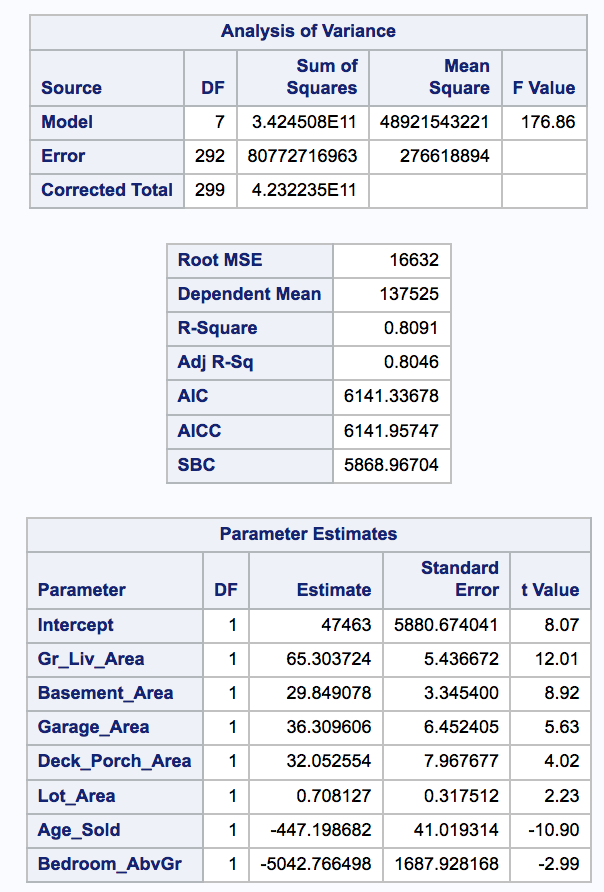

In [11]:
display(Image("fig/StepWise.png", width=400))

## Information Criterion and Other Selection Options
Information criteria can also be used to evaluate models, in which it will minimize the unexplained variability using as few effects within the models as possible. The model with as few effects as possible is referred to as the most parsimonious model.

The calculation for each information criterion begins with
$$\displaystyle n log \left( \frac{SSE}{n} \right)$$
It then invokes a penalty representing the complexity of the model. 
    - n is the number of observations
    - p is the number of parameter including the intercept
    - the estimate of pure variance from fitting the full model is $\widehat{\sigma}^2$
    For each information criterion, smaller is better.

|Information Criterion|Penalty Component|
|---------------------|-----------------|
|AIC                  |$2p+n+2$|
|AICC                 | $\displaystyle \frac{n(n+p)}{n-p-2}$|
|BIC                  | $\displaystyle 2(p+2)q-2q^2$|
|SBC                  | $plog(n)$          |

    - Akaike's Information Criterion (AIC)
    - Corrected Akaike's Information Criterion (AICC)
    - Sawa Bayesian Information Criterion (BIC)
    - Schwarz Bayesian Information Criterion (SIC)
- The R-square always increases or stays the same as you include more terms in the model.
- **st104d02**

```SAS
ods graphics on;
proc glmselect data=STAT1.ameshousing3 plots=all;
	STEPWISEAIC: model SalePrice = &interval / selection=stepwise details=steps select=AIC;
	title "Stepwise Model Selection for SalePrice - AIC";
run;

proc glmselect data=STAT1.ameshousing3 plots=all;
	STEPWISEBIC: model SalePrice = &interval / selection=stepwise details=steps select=BIC;
	title "Stepwise Model Selection for SalePrice - BIC";
run;

proc glmselect data=STAT1.ameshousing3 plots=all;
	STEPWISEAICC: model SalePrice = &interval / selection=stepwise details=steps select=AICC;
	title "Stepwise Model Selection for SalePrice - AICC";
run;

proc glmselect data=STAT1.ameshousing3 plots=all;
	STEPWISESBC: model SalePrice = &interval / selection=stepwise details=steps select=SBC;
	title "Stepwise Model Selection for SalePrice - SBC";
run;
```
- **SELECT=** specify a different selection criterion: AIC, BIC, AICC, and SBC.

## All Possible Selection (<font color='red'>proc reg</font>)
### Mallows' Cp
$$\displaystyle C_p = p + \frac{(MSE_p - MSE_{full})(n-p)}{MSE_{full}}$$
    - $MSE_p$ is the mean squared error for the model with p parameters.
    - $MSE_{full}$ is the mean squared error for the full model used to estimate the true residual variance.
    - $n$ is the number of observations.
    - $p$ is the number of parameters, including an intercept parameter, if estimated.
- Mallows’ Cp is a simple indicator of effective variable selection within a model.
- Look for models with Cp ≤ p, where p equals the number of parameters in the model, including the intercept.
- Mallows recommends choosing the first (fewest variables) model where Cp approaches p.

- Hocking's Criterion
    - $C_p \le p$ for prediction
    - $C_p \le 2p-p_{full}+1$ for parameter estimation 
- **st104d03**

```SAS
ods graphics on;
proc reg data=STAT1.ameshousing3 plots(only)=(rsquare adjrsq cp);
	ALLPOSS: model SalePrice = &interval / selection=rsquare adjrsq cp;
	title "All Possible Model Selection for SalePrice";
run;
quit;

proc reg data=STAT1.ameshousing3 plots(only)=(cp);
	ALLPOSS: model SalePrice = &interval / selection=cp rsquare adjrsq best=20;
	title "Best Models Using All Possible Selection for SalePrice";
run;
quit;
```
- **SELECTION=** enables you to choose the different selection methods: RSQUARE, ADJRSQ, and CP. The first listed method is the one that determines the sorting order in the output.
    - **RSQUARE**:tells PROC REG to use the model R-square to rank the model from best to worst for a given number of variables.
    - **ADJRSQ**:prints the adjusted R-square for each model.
    - **CP**:prints Mallows' Cp statistic for each model.
- **Best=n** limits the output to only the best n models.

## Questions
- In forward selection, after a variable is added to the model, it stays in, even if it becomes non-significant later.
- When interpret *p*-value from models that are chosen using any automated variable selection technique, you shoud be cautions
    - Incorrect calculation of degrees of freedom
    - Biases in parameter estimates, predictions, and standard errors
    - *p*-value that tend to error on the side of overestimating significance
- The R-square always increases or stays the same when you include more terms in the model. Therefore, choosing the 'best' model is not as simple as making the R-square as large as possible.
- Information critera (AIC, AICC, BIC, SBC)
    - Formulas for all information criteria begin with the same calculation
    - The penalty term to assess the complexity of the model enables information criteria to be a usefule means of comparing models with a different number of parameters
    - The best model is the one with the smallest information criteria value.

# Model Post-Fitting for Inference
## Examining Residuals  (<font color='red'>proc reg</font>)
- We should always produce a scatter plot before conduct a regression analysis;
- Verifying Assumptions using residual plots: 
    - The plot of residuals versus predicted values. We want to see a random scatter, with no patterns of our residuals above and below the 0 reference line.
    - The residuals versus quantile plot is a normal quantile plot of the residuals.
    - If the residuals are normally distributed, the QQ-plot should appear to be a straight, diagonal line. 
    - The Fit-Mean picture shows the predicted or fitted values minus the overall mean, used to determine whether the vertical spread of the residuals in the plot on the right is greater than the spread of the centered fit in the plot on the left.
- **st105d01**

```SAS
proc reg data=STAT1.ameshousing3 
         plots(only)=(QQ RESIDUALBYPREDICTED RESIDUALS);
    CONTINUOUS: model SalePrice 
                  = &interval;
    title 'SalePrice Model - Plots of Diagnostic Statistics';
run;
quit;
```

## Influential Observations (<font color='red'>proc reg</font>)
- An outlier is an unusual data point.  Use **STUDENT residuals** as a way to detect outliers.
$$ S_{residuals} = \frac{y-\widehat{y}}{SE}$$
- An influential observation is an unusual data point that has a large effect on some part of the model.
    - **RSTUDENT residuals**: calculated after deleting the ith observation. If Rstudent <> Student, the observation is probably influential. If the absolute value of the RSTUDENT residuals is > 3, you've probably detected an influential observation. 
    - **Cook's D statistics** 
        - Calculate a Cook's D statistic for each observation in a data set as if that observation weren't in the data set.
        - If any observation has $\displaystyle Cook's D_i \gt \frac{4}{n}$, where n is the sample size, that observation is influential.
    - **DFFITS statistics** 
        - DFFITS is most useful for predictive models.
        - The difference between the two predicted values(w/o observation) is divided by the standard error of the predicted value  without the observation. 
        $$\displaystyle Diffits_i = \frac{\widehat{Y_i}-\widehat{Y_{(i)}}}{S(\widehat{Y_i})} > 2\sqrt{\frac{p}{n}}$$
where p is the number of terms in the model, including the intercept, and n is the sample size. 
If the absolute value of DFFITS for any observation is greater than this cutoff value, you've detected an influential observation.
    - Use **DFBETAS** to identify which parameter the observation might be influencing most.
        - DFBETA is calculated per predictor variable per observation.
        - First use Cook's D to determine who is influential, and then use DFBETAS to determine which specific predictor is being influenced by that observation.
        $$\displaystyle \frac{\widehat{\beta_i}-\widehat{\beta_{(i)}}}{SE_{(\widehat{\beta})}} > 2 $$
indicate observations that are influential in estimating a given parameter.

- **st105d02**

```SAS
ods select none;
proc glmselect data=STAT1.ameshousing3 plots=all;
	STEPWISE: model SalePrice = &interval 
    / selection=stepwise details=steps select=SL slentry=0.05 slstay=0.05;
	title "Stepwise Model Selection for SalePrice - SL 0.05";
run;
quit;
ods select all;
```
- Using the stepwise selection method to automatically select a model. 
- It automatically creates the macro variable **_GLSIND** to save the list of the chosen model effects.
- **ODS SELECT NONE**, suppresses the output, 
- **ODS SELECT ALL** at the end of the step to make sure that we get the output from the next step we run.

```SAS
ods graphics on;
ods output RSTUDENTBYPREDICTED=Rstud 
           COOKSDPLOT=Cook
           DFFITSPLOT=Dffits 
           DFBETASPANEL=Dfbs;
proc reg data=STAT1.ameshousing3 
         plots(only label)=
              (RSTUDENTBYPREDICTED 
               COOKSD 
               DFFITS 
               DFBETAS);
    SigLimit: model SalePrice = &_GLSIND; 
    title 'SigLimit Model - Plots of Diagnostic Statistics';
run;
quit;
```

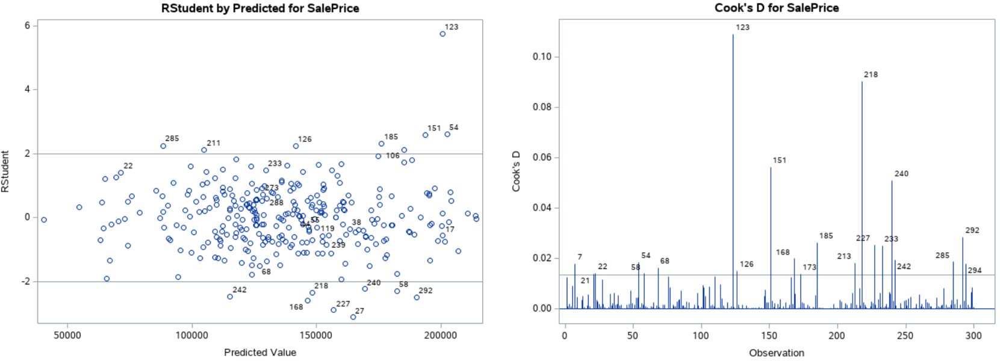

In [12]:
display(Image("fig/RS_CookD.png", width=1000))

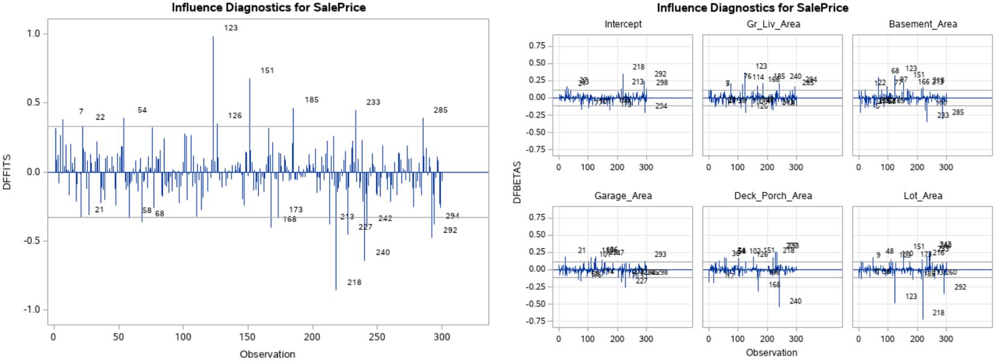

In [13]:
display(Image("fig/Dffits_Dfbeta.png", width=1000))

**Examine the influential Observation with Proc print**
```SAS
proc print data=influential;
    id observation;
    var Rstudent CooksD Dffitsout _dfbetasout:; 
run;

data influential;
/*  Merge datasets from above.*/
    merge Rstud
          Cook 
          Dffits
		  Dfbs2;
    by observation;
/*  Flag observations that have exceeded at least one cutpoint;*/
    if (ABS(Rstudent)>3) or (Cooksdlabel ne ' ') or Dffitsout then flag=1;
    array dfbetas{*} _dfbetasout: ;
    do i=2 to dim(dfbetas);
         if dfbetas{i} then flag=1;
    end;
/*  Set to missing values of influence statistics for those*/
/*  that have not exceeded cutpoints;*/
    if ABS(Rstudent)<=3 then RStudent=.;
    if Cooksdlabel eq ' ' then CooksD=.;
/*  Subset only observations that have been flagged.*/
    if flag=1;
    drop i flag;
run;
```

### Handling Influential Observation
- First, recheck for data entry errors and correct them if possible.
- Second, if the data appears to be valid, consider whether you have an adequate model.
- Third, determine whether the influential observation is valid, and only unusual.
- As a general rule, you should not exclude data. 
    - If you choose to exclude some observations, 
        - include a description of the types of observations that were excluded and why as part of your report or presentation.
        - you should discuss the limitation of your conclusions, given the exclusions.

## Collinearity (<font color='red'>proc reg / vif</font>)
- Collinearity (multicollinearity): two or more predictor variables are highly correlated with each other.
- Collinearity causes instability in the model by inflating the variance of the parameter estimates, which raises the p-values. However, **it doens't violate any assumptions**.
- Collinearity occurs when **there is correlation present among predictor variables in the model**. If the predictor variables are not correlated, then there's no collinearity present in the model.
- Collinearity would make the parameter estimates unstable and the standard errors large.
- Collinearity detection such as **Variance Inflation Factors**.
- Problems of colinearity:
    - it leads to inflated standard errors. 
    - it leads to instability in the regression model. 
    - So, deal with collinearity before using any automated model selection tool.

- **st105d03**

```SAS
proc corr data=amescombined nosimple;
    var &interval;
    with score;
run;
```
- **PROC CORR** step produces **Pearson correlation statistics and corresponding p-values**.
- **nosimple** option to suppress the descriptive statistics.

```SAS
proc reg data=amescombined;
    model SalePrice = &interval score / vif;
    title 'Collinearity Diagnostics';
run;
quit;

proc reg data=amescombined;
    NOSCORE: model SalePrice = &interval / vif;
    title2 'Removing Score';
run;
quit;
```
- **VIF** (variance inflation factor)
$$\displaystyle VIF_i = \frac{1}{1-R^2_i}$$
    - $R^2_i$ is the R-square value when regressing the *ith* predictor;
    - If **$VIF > 10$ for any predictors in the model, those predictors are likely involved in collinearity**.
-  If a composite variable is included in a model along with some or all of its component measures, there's bound to be collinearity.
- Because collinearity can have a substantial effect on the outcome of a stepwise model selection procedure, it's advisable to deal with collinearity before using any automated model selection tool.

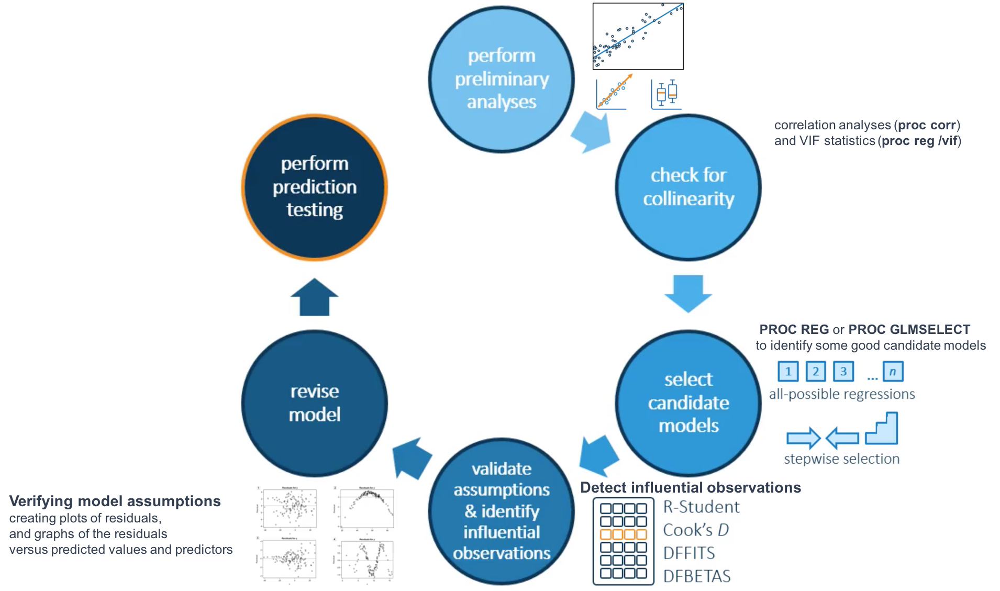

In [14]:
display(Image("fig/Model_circle.png", width=800))

# Model Building for Scoring and Prediction
## Predictive Modeling 

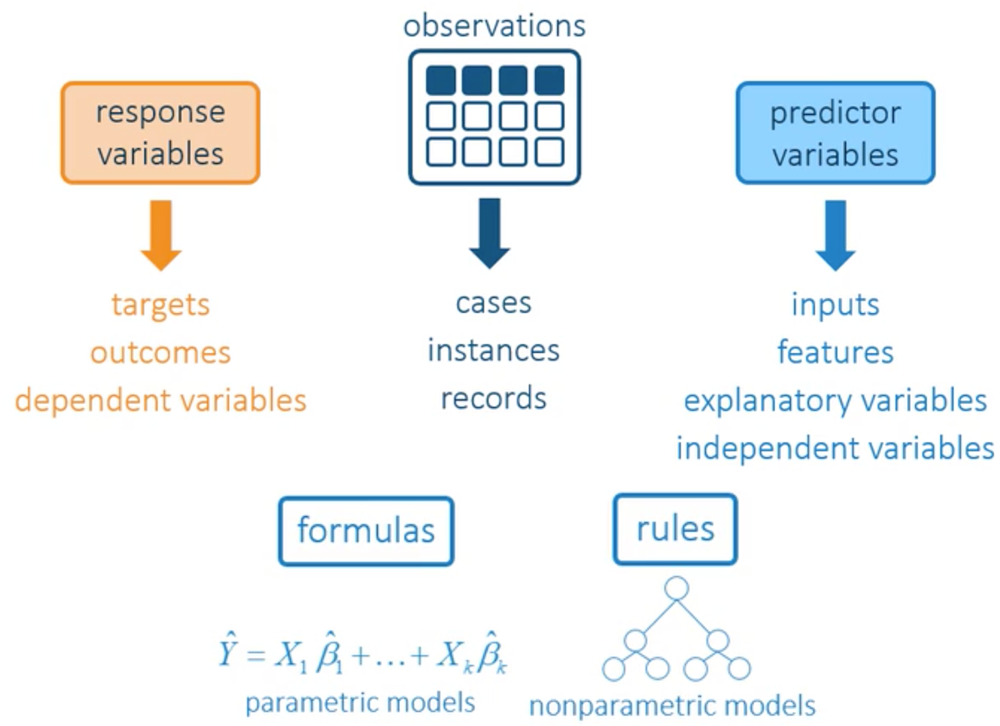

In [15]:
display(Image("fig/Predic model.png", width=500))

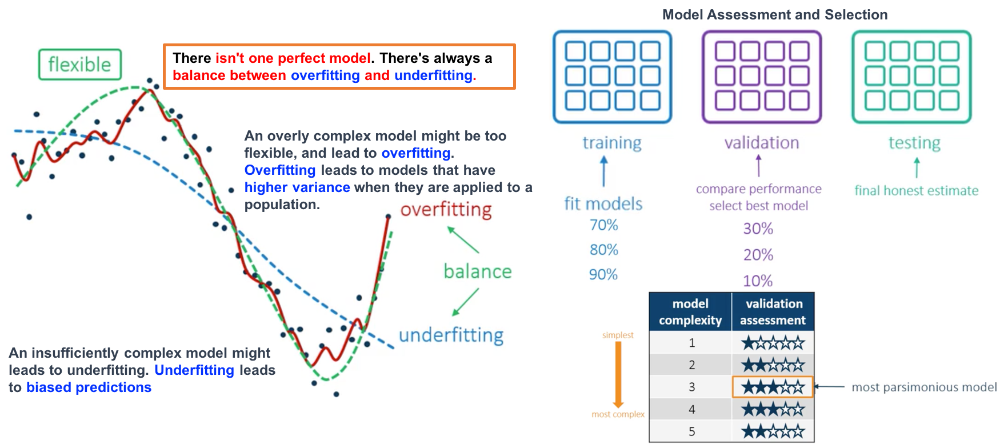

In [16]:
display(Image("fig/UnOverFit.png", width=1000))

- The best model is the simplest (the most parsimonious) model that has the best performance on the validation data. The training data is used to fit the model and generate the possible models to be assessed.
- **st106d01** 

```SAS
proc glmselect data=STAT1.ameshousing3
               plots=all 
               valdata=STAT1.ameshousing4;
    class &categorical / param=glm ref=first;
    model SalePrice=&categorical &interval / 
               selection=backward
               select=sbc 
               choose=validate;
    store out=STAT1.amesstore;
    title "Selecting the Best Model using Honest Assessment";
run;
```
-  **VALDATA=** identifies the validation data set;
-  **PARAM=** specifies *GLM* parameterization, where one design variable, also known as a dummy or indicator variable, is produced for each level of each CLASS variable.
-  **REF=FIRST** causes the first level of the CLASS variable to be treated as the redundant level, and the parameter estimates of all other levels will be compared to that reference level. The default is REF=LAST.
- **SBC** (the Schwarz-Bayesian criterion) to determine which variables remain in the model. SBC is the default criterion for PROC GLMSELECT.
- **CHOOSE=VALIDATE** specifies that the best model will be selected based on the *smallest average squared error*, or ASE, for the validation data. 
$$\displaystyle ASE = \frac{\sum{y_i-\widehat{y}_i}}{n}$$
- **STORE out=** stores output to file. 

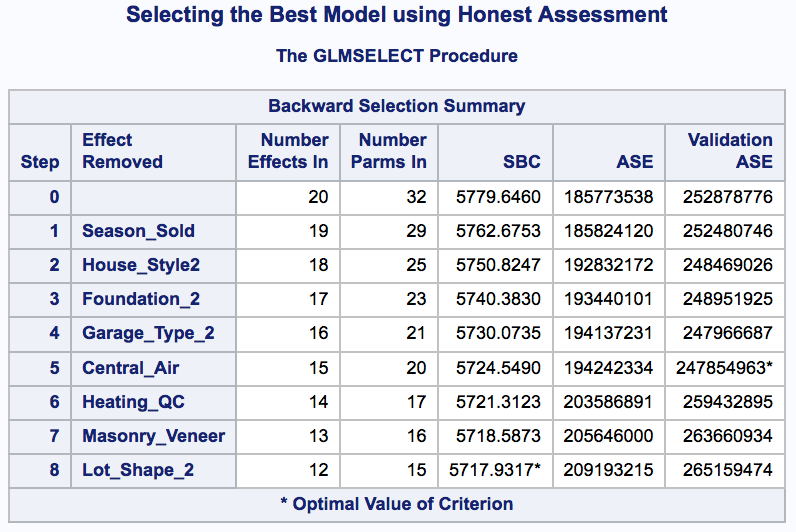

In [17]:
display(Image("fig/amesstore.png", width=500))

- **SBC** column, SBC value continues to decrease as long as variables to be removed.
- **ASE** column reports the training average squared error
- **Validation ASE** column, ensure that the chosen model generalizes well to new data.

### Partitioning a Data Set Using (<font color='red'>proc glmselect</font>)
- **st106s01**

```SAS
proc glmselect data=STAT1.ameshousing3
               plots=all 
               seed=8675309;
    class &categorical / param=ref ref=first;
    model SalePrice=&categorical &interval / 
               selection=stepwise
               (select=aic 
               choose=validate) hierarchy=single;
    partition fraction(validate=0.3333);
    title "Selecting the Best Model using Honest Assessment";
run;
```
- **PARTITION** statement to specify how the cases in the input data set are partitioned into holdout samples for model validation and testing. 
    - **PARTITION FRACTION(VALIDATE=.25);**
- **SEED=** option. Whenever you run the PROC GLMSELECT step and use the same seed value, the selection process is replicated and the same results are generated.

## Scoring Predictive Models  (<font color='red'>proc plm</font>)

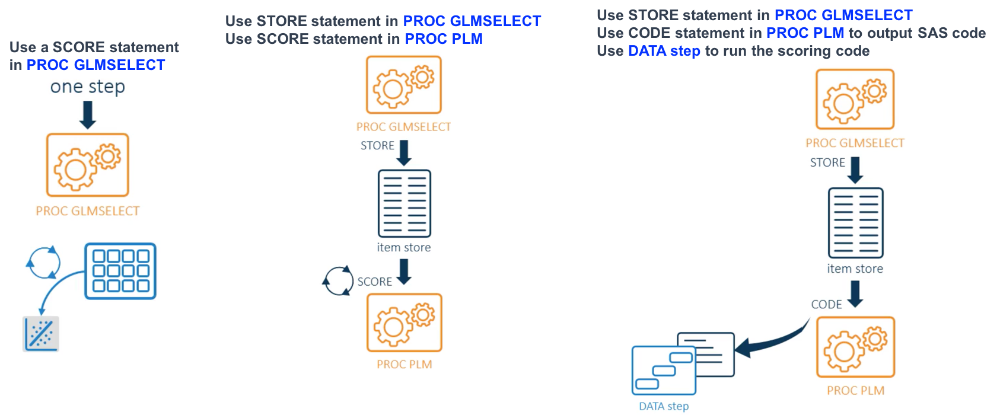

In [18]:
display(Image("fig/ScoreMethod.png", width=800))

- **st106d02**

```SAS
/* Method 2 */
proc plm restore=STAT1.amesstore;
    score data=STAT1.ameshousing4 out=scored;
    code file="&homefolder\scoring.sas";
run;
/* Method 3 */
data scored2;
    set STAT1.ameshousing4;
    %include "&homefolder\scoring.sas";
run;

proc compare base=scored compare=scored2 criterion=0.0001;
    var Predicted;
    with P_SalePrice;
run;
```
- <font color='red'>**proc plm**</font>
    - **RESTORE=** option specifies *amesstore*, the item store that **contains the model information.**
    - **SCORE** statement scores the ameshousing4 data and creates a new data set *scored*, which contains the input data and the scored variable **Predicted**.
    - **CODE** statement writes the scoring instructions code to scoring.sas
- <font color='red'>**data step**</font>
    - **DATA** step create a scoring variable. By default, the name of this new variable is the original variable name prefixed with **P_**
    - **%INCLUDE** statement copies the scoring code from scoring.sas
- <font color='red'>**proc compare**</font>
    - **BASE=** option specifies scored, the data set created by the SCORE statement.
    - **COMPARE=** option specifies scored2, the data set created by the DATA step.
    - **CRITERION=** used for judging the equality of the numeric values (by default 0.00001)
    - **VAR** statement names the scored variable in the **BASE=** data set (**Predicted**)
    - **WITH**& statement specifies the scored variable in the **COMPARE=** data set (**P_SalePrice**) 

# Categorical Data Analysis
## Describing Categorical Data
**st107d01**

```SAS
proc format;
    value bonusfmt 1 = "Bonus Eligible"
                   0 = "Not Bonus Eligible";
run;

proc freq data=STAT1.ameshousing3;
    tables Bonus Fireplaces Lot_Shape_2         /* Individual tables */
           Fireplaces*Bonus Lot_Shape_2*Bonus/  /* Cross Table, row*column*/
           plots(only)=freqplot(scale=percent);
    format Bonus bonusfmt.;
run;

proc univariate data=STAT1.ameshousing3 noprint;
    class Bonus;  
    var Basement_Area ;
    histogram Basement_Area;  /* histograms for each level of Bonus */
    inset mean std median min max / format=5.2 position=nw;
    format Bonus bonusfmt.;
run;
```
- **Crosstabulation table** shows frequency statistics for the combinations of levels of two variables.
- **proc univariate**: distribution of the continuous variable. 
- **INSET statement** to create a box of summary statistics in the northwest corner of the graph.

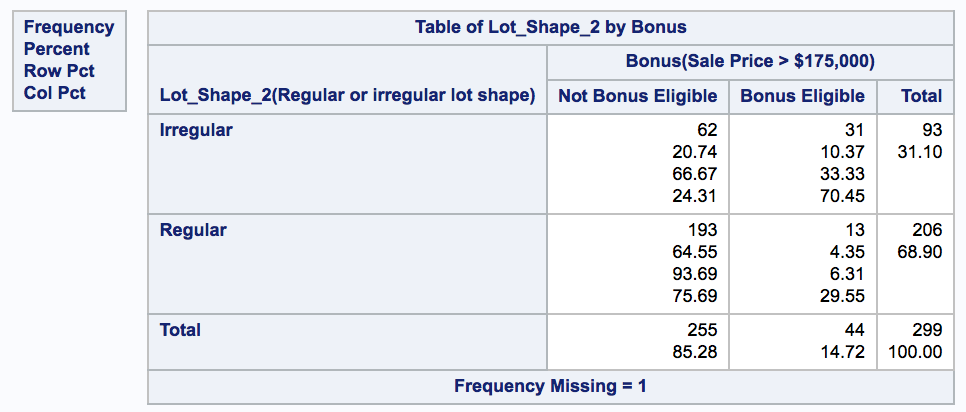

In [19]:
display(Image("fig/freq.png", width=500))

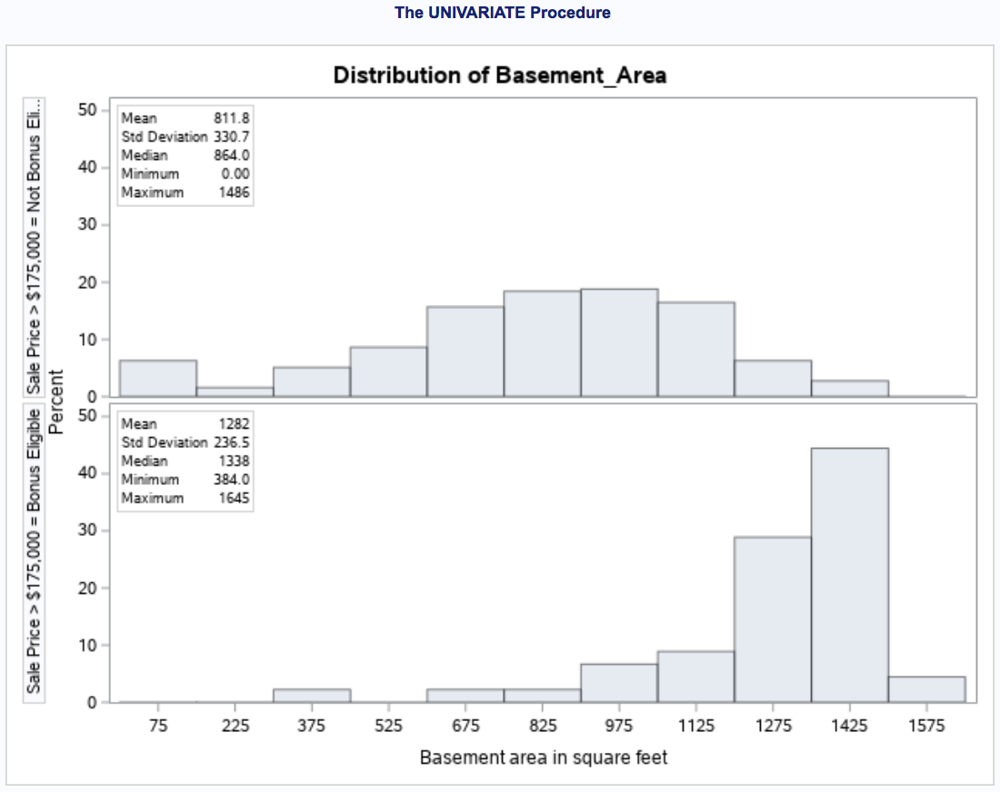

In [20]:
display(Image("fig/univariate.png", width=500))

## Tests of Association

### <font color='red'>Pearson chi-square test</font>

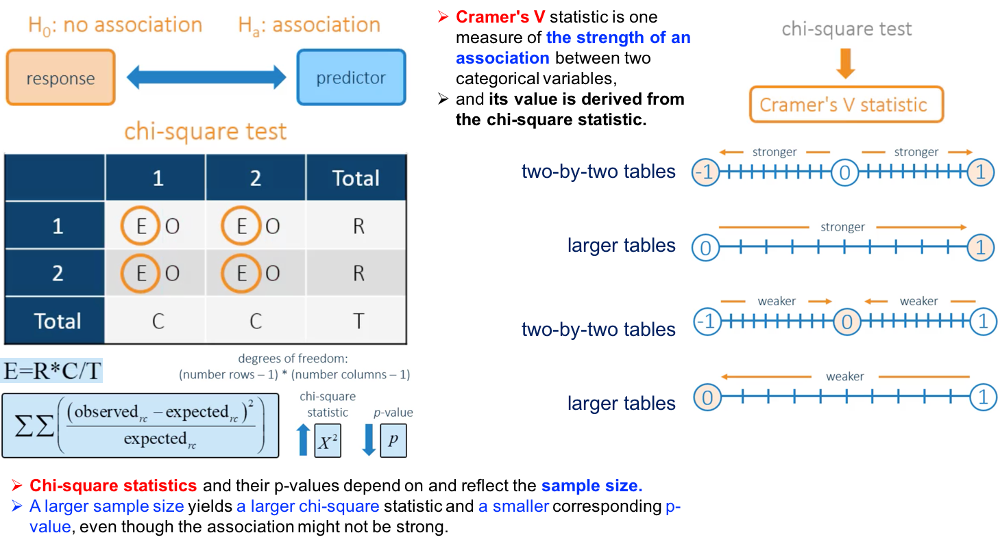

In [21]:
display(Image("fig/chi2.png", width=800))

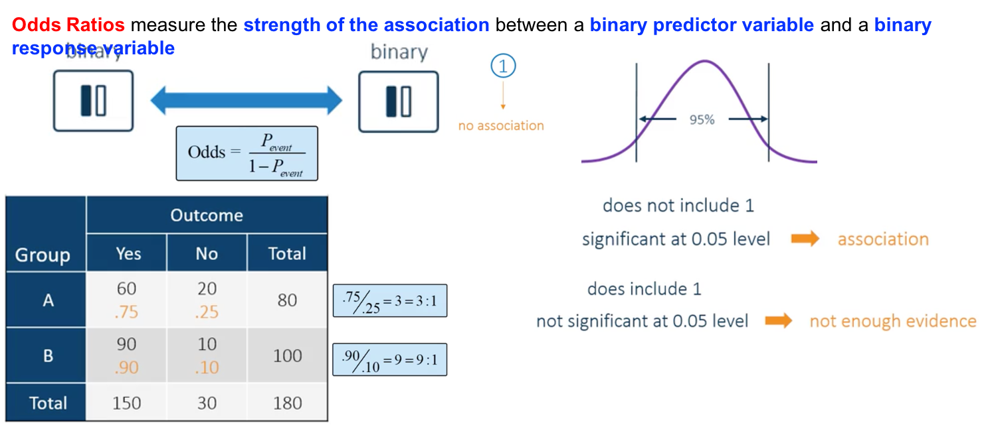

In [22]:
display(Image("fig/OddsRatio.png", width=800))

**st107d02**
```SAS
proc freq data=STAT1.ameshousing3;
    tables (Lot_Shape_2 Fireplaces)*Bonus
          / chisq expected cellchi2 nocol nopercent 
            relrisk;
    format Bonus bonusfmt.;
    title 'Associations with Bonus';
run;
```
- **chisq**: produces the Pearson chi-square test of association (**Pearson chi-square test for all possible associations**).
- **expected**: prints the expected cell counts(based on the null hypothesis of no association). 
- **cellchi2**: prints each cell's contribution to the total chi-square statistic
- **nocol**: don't print the column percentages
- **nopercent**: don't print the cell percentages
- **relrisk**: print a table that contains risk ratios, or probability ratios, and the odds ratios.
- When your sample size **decreases**, your **chi-square value decreases, causing both the p-value and CI width to increase** because the hypothesis test becomes less significant. **Cramer’s V statistic and odds ratios are not affected by sample size.**

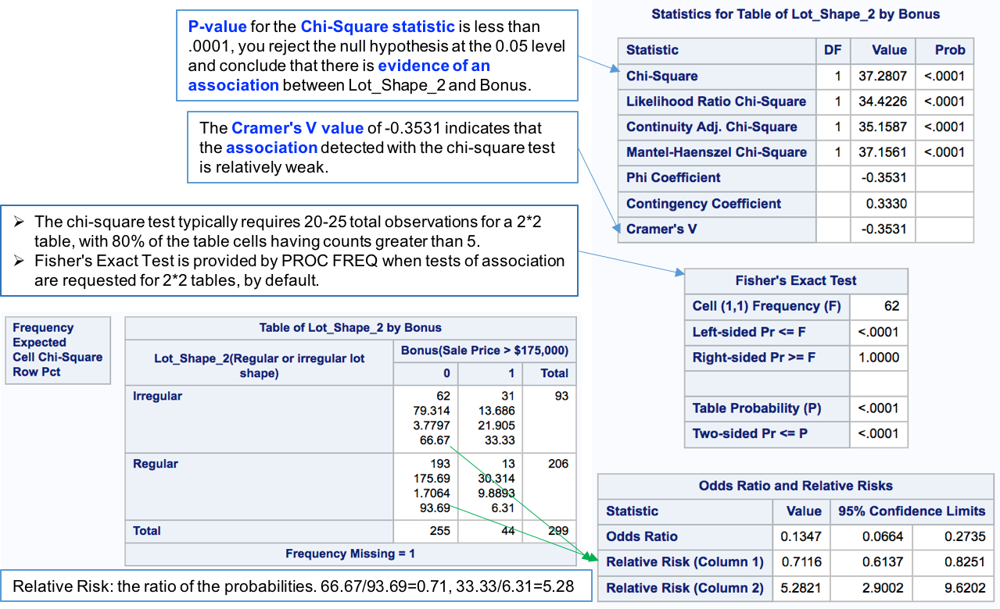

In [23]:
display(Image("fig/CCorrlation.png", width=800))

### Ordinal Association <font color='red'>Mantel-Haenszel test & Spearman correlation</font> 
- Example: The Mantel-Haenszel chi-square p-value is 0.01 and the Spearman correlation statistic is 0.253. 
    - The p-value is significant (less than 0.05) so there is an ordinal association. 
    - The Spearman correlation statistic is positive, so the ordinal association is positive.

- **st107d03**
```SAS
proc freq data=STAT1.ameshousing3;
    tables Fireplaces*Bonus / chisq measures cl;
    format Bonus bonusfmt.;
    title 'Ordinal Association between FIREPLACES and BONUS?';
run;
```
- **chisq**: produces the Pearson chi-square, the likelihood-ratio chi-square, and the Mantel-Haenszel chi-square. 
- **measures**: produces the **Spearman correlation statistic**.
- **cl**: produces **confidence limits** for the statistics that the MEASURES option requests. 

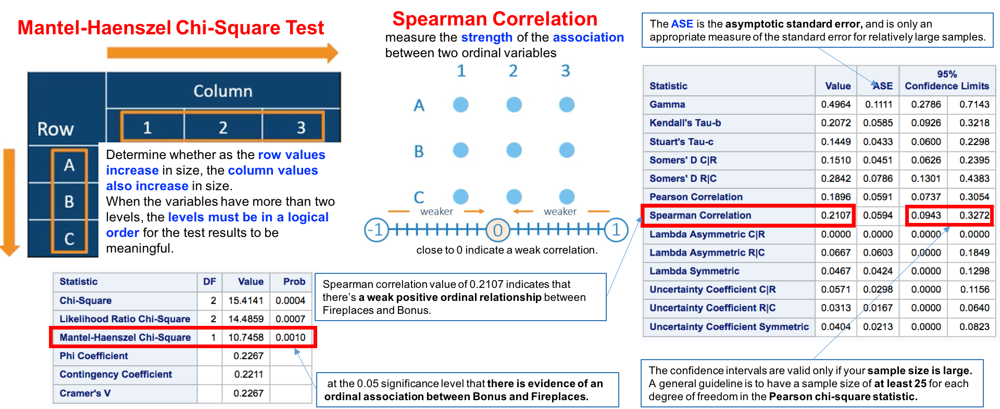

In [24]:
display(Image("fig/MHSpearman.png", width=1000))

# Logistic Regression

Modeling the relationship between a **binary response and a set of predictor variables.**
- A probability is bounded by 0 and 1. The logit of the probability transforms the probability into a linear function, which has no lower or upper bounds.

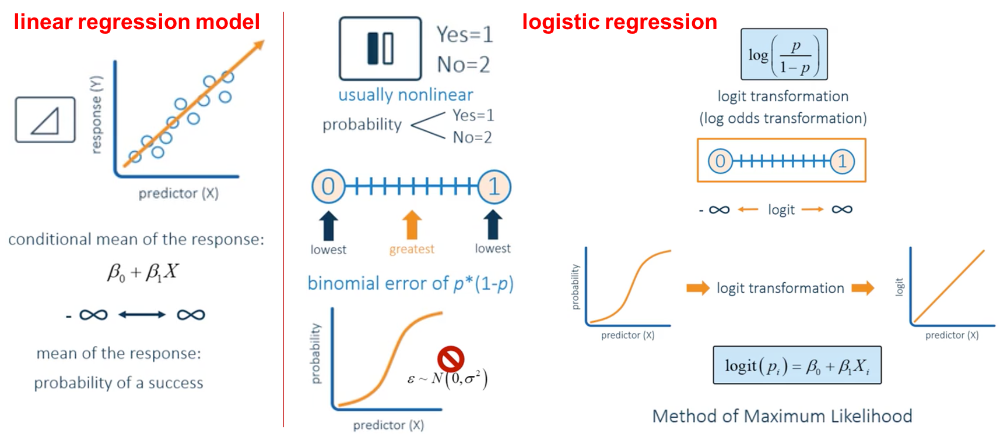

In [25]:
display(Image("fig/LogReg.png", width=1000))

- **st107d04**
```SAS
proc logistic data=STAT1.ameshousing3 alpha=0.05
              plots(only)=(effect oddsratio);
    model Bonus(event='1')=Basement_Area / clodds=pl;
    title 'LOGISTIC MODEL (1):Bonus=Basement_Area';
run;
```
- **MODEL** specifies the **response variable** Bonus
- **EVENT=** specifies the event category for the binary response. Event category is the value 1 for Bonus.
- **CLODDS=** compute confidence intervals for the odds ratios of all predictor variables. **PL** for profile likelihood, **WALD**, or **BOTH**. PROC LOGISTIC computes **Wald confidence intervals** by default.
    - Profile-likelihood confidence intervals are desirable for small sample sizes. 
    - Wald statistics require fewer computations to perform.

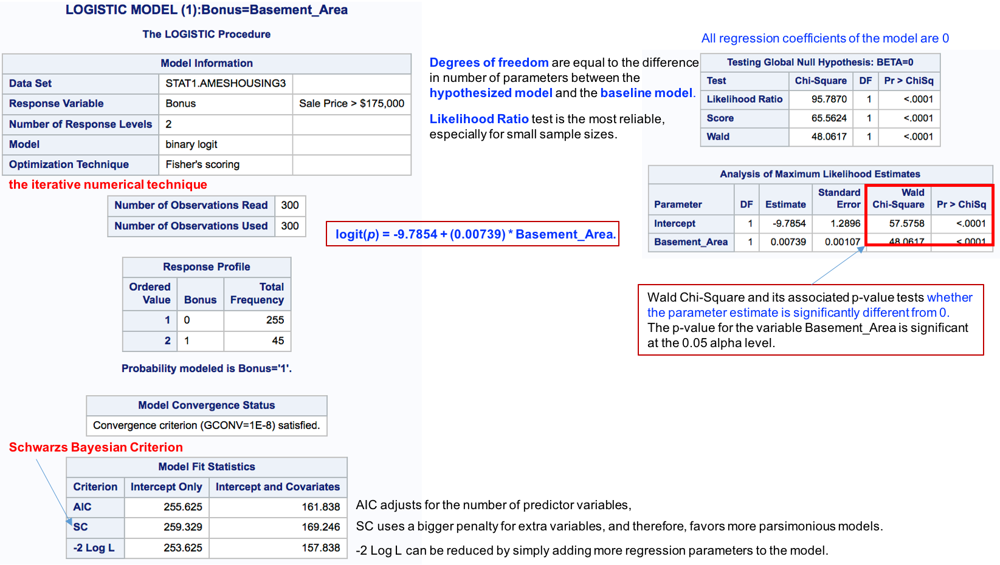

In [26]:
display(Image("fig/LogRegOutput1.png", width=1000))

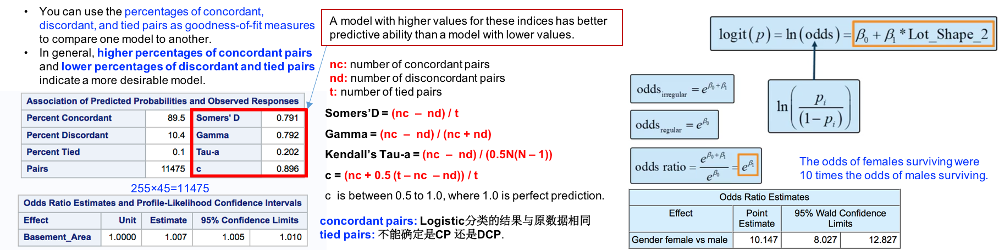

In [27]:
display(Image("fig/LogRegOutput2.png", width=1000))

## Logistic Regression with Categorical Predictors

**st107d05**
```SAS
proc logistic data=STAT1.ameshousing3 plots(only)=(effect oddsratio);
    class Fireplaces(ref='0') Lot_Shape_2(ref='Regular') / param=ref;
    model Bonus(event='1')=Basement_Area Fireplaces Lot_Shape_2 / clodds=pl;
    units Basement_Area=100;
    title 'LOGISTIC MODEL (2):Bonus= Basement_Area Fireplaces Lot_Shape_2';
run;
```
- PROC LOGISTIC does not work directly with the categorical predictor variables in the **CLASS statement**. It need codes each predictor variable.

**st107s03**
```SAS
proc logistic data=STAT1.safety plots(only)=(effect oddsratio);
    class Region (param=ref ref='Asia')
          Size (param=ref ref='3');
    model Unsafe(event='1')=Weight Region Size / clodds=pl;
    title 'LOGISTIC MODEL (2):Unsafe=Weight Region Size';
run;
```

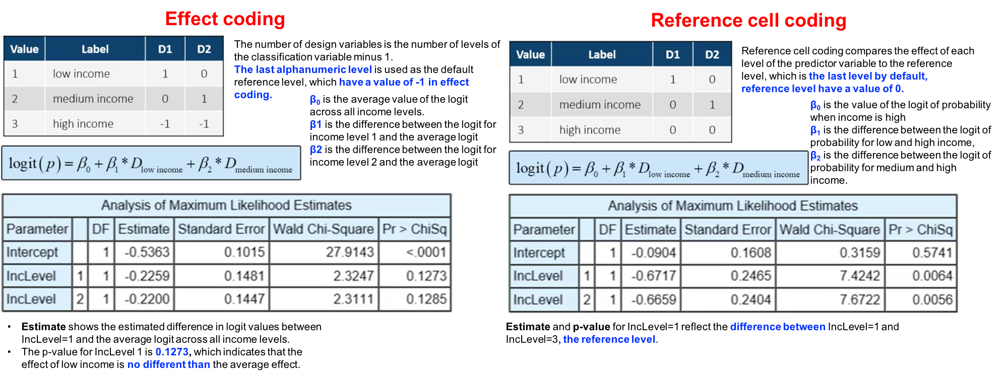

In [28]:
display(Image("fig/LogRegOutput3.png", width=1000))

## Stepwise Selection with Interactions and Predictions
### Fitting a Multiple Logistic Regression Model with Interactions
**st107d06**

```SAS
proc logistic data=STAT1.ameshousing3 
			  plots(only)=(effect oddsratio);
    class Fireplaces(ref='0') Lot_Shape_2(ref='Regular') / param=ref;
    model Bonus(event='1')=Basement_Area|Fireplaces|Lot_Shape_2 @2 / 
          selection=backward clodds=pl slstay=0.10;
    units Basement_Area=100;
    title 'LOGISTIC MODEL (3): Backward Elimination '
          'Bonus=Basement_Area|Fireplaces|Lot_Shape_2';
run;
```
- **MODEL** statement lists the three main effects
    - **vertical bar operator** between each pair to specify their interactions. 
    - **@2** indicates to include only the two-factor interactions along with the main effects. 
    - If you increase it to **@3**, then you construct a model with all the main effects, the two-factor interactions, and the three-factor interaction.
- **SELECTION=** specifies the backward elimination method for variable selection, and 
    - **SLSTAY** changes the significance level to 0.10. 
    - Using an iterative process, PROC LOGISTIC eliminates terms one at a time, starting with the least significant interaction, the one with the largest p-value. 
    - By default, PROC LOGISTIC preserves model hierarchy, meaning, if an interaction is in the model, the main effects contributing to it must remain in the model, whether they are significant or not. 
    - Therefore, the procedure only considers main effects for possible removal if the corresponding interaction has first been removed.

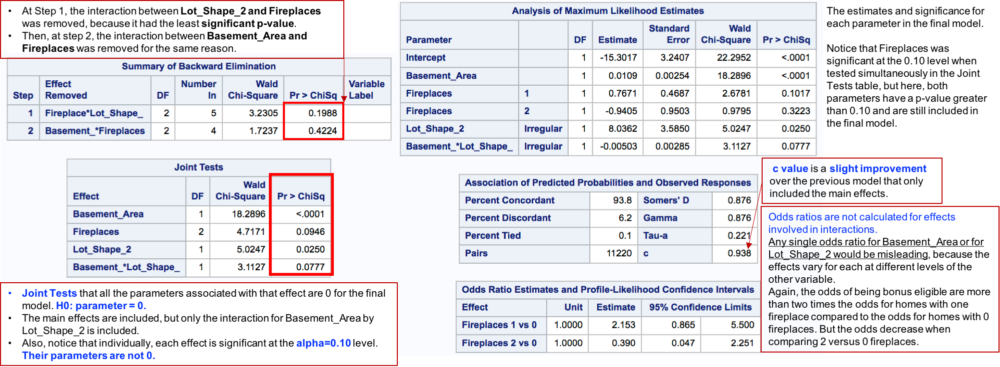

In [29]:
display(Image("fig/LogRegOutput4.png", width=1000))

### Fitting a Multiple Logistic Regression Model with All Odds Ratios
**st107d06**

```SAS
proc logistic data=STAT1.ameshousing3 
              plots(only)=oddsratio(range=clip);
    class Fireplaces(ref='0') Lot_Shape_2(ref='Regular') / param=ref;
    model Bonus(event='1')=Basement_Area|Lot_Shape_2 Fireplaces;
    units Basement_Area=100;
    oddsratio Basement_Area / at (Lot_Shape_2=ALL) cl=pl;
    oddsratio Lot_Shape_2 / at (Basement_Area=1000 1500) cl=pl;
    title 'LOGISTIC MODEL (3.1): Bonus=Basement_Area|Lot_Shape_2 Fireplaces';
run;
```
- **RANGE=CLIP** is helpful when one or more odds ratio confidence intervals are so large that the scale makes it difficult to see the smaller ones.
- **AT** specifies fixed levels of one or more interacting variables. 
- **ALL** to select all levels of the variable.

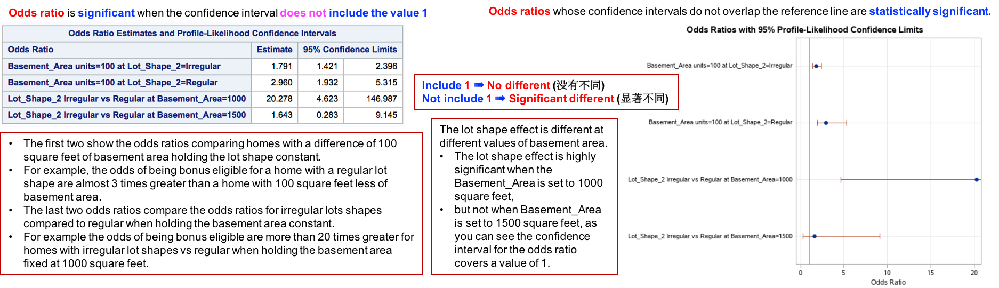

In [30]:
display(Image("fig/LogRegOutput5.png", width=1000))

**st107d07**
```SAS
ods select none; /* suppresses the output */
proc logistic data=STAT1.ameshousing3;
    class Fireplaces(ref='0') Lot_Shape_2(ref='Regular') / param=ref;
    model Bonus(event='1')=Basement_Area|Lot_Shape_2 Fireplaces;
    units Basement_Area=100;
	store out=isbonus; /* STORE: save the model */
run;
ods select all; /* Get the output from the next step */
```
```Text
data newhouses;   /* New data we want to score */
	length Lot_Shape_2 $9;
	input Fireplaces Lot_Shape_2 $ Basement_Area;
	datalines;
	0  Regular    1060
	2  Regular     775
	2  Irregular  1100
	1  Irregular   975
	1  Regular     800
	;
run;
```
```SAS
proc plm restore=isbonus; /* Generate predictions for newhouses */
	score data=newhouses out=scored_houses / ILINK;
	title 'Predictions using PROC PLM';
run;

proc print data=scored_houses;
run;
```
- **ILINK** option requests predictions on the probability scale as opposed to the logit scale. It can makes the predictions easier to interpret.

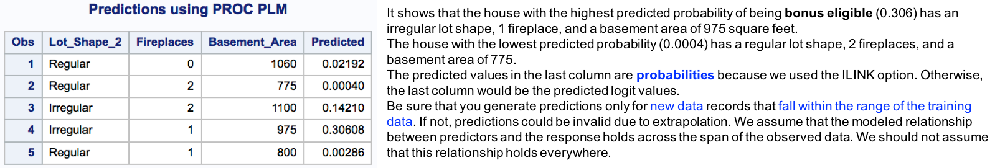

In [31]:
display(Image("fig/LogRegOutput6.png", width=1000))